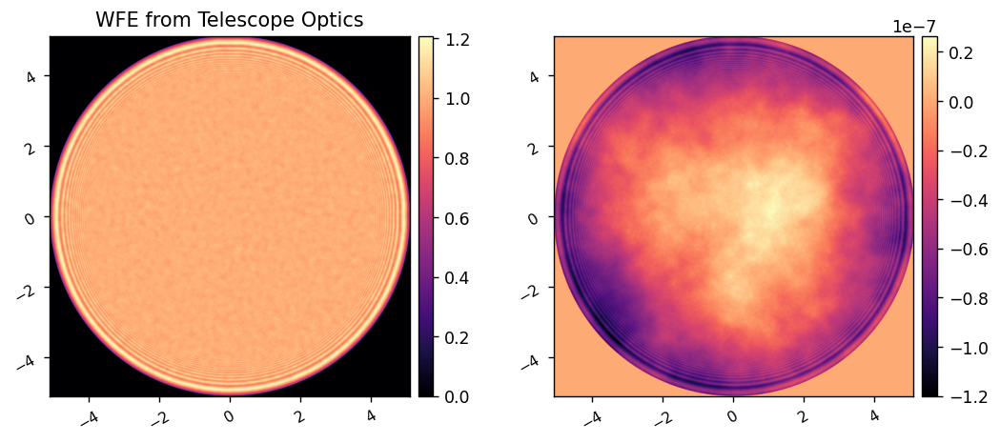

In [1]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import poppy
xp = cp if poppy.accel_math._USE_CUPY else np

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = False

import warnings
warnings.filterwarnings("ignore")

from prop_models import full, agpm
reload(full)

from wfsc_1dm import utils

from imshows import *

pupil_diam = 10.2*u.mm
wavelength_c = 750e-9*u.m

reload(agpm)
vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm/2, gray_pixel=False)

ote_wfe_fname = 'ote-wfe-data/telescope_wfe_0.fits'
wfe_hdu = fits.open(ote_wfe_fname)
wfe = xp.array(wfe_hdu[0].data)
wfe_pxscl = wfe_hdu[0].header['PIXELSCL'] * u.m/u.pix
wfe_hdu.close()
OTE_WFE = poppy.ArrayOpticalElement(transmission=wfe[0], opd=wfe[1], pixelscale=wfe_pxscl,)
imshow2(OTE_WFE.amplitude, OTE_WFE.opd, 'WFE from Telescope Optics', pxscl=OTE_WFE.pixelscale.to(u.mm/u.pix))

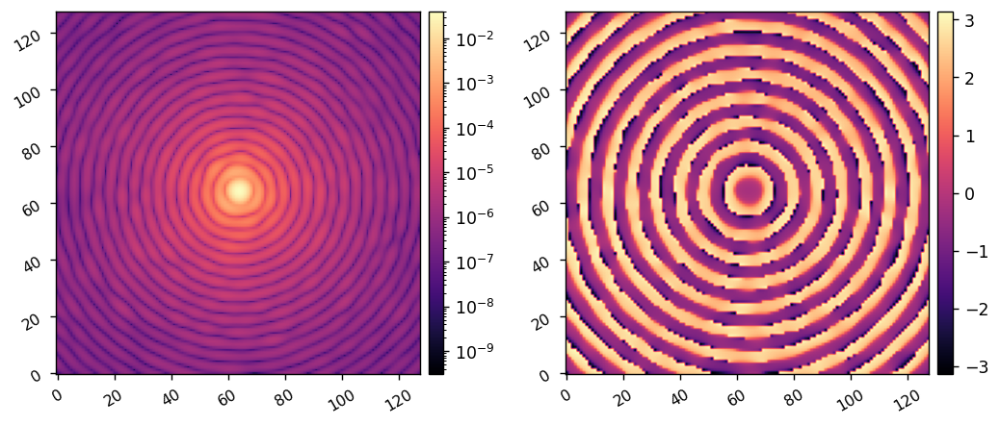

In [4]:
reload(full)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = full.CORO()

c.npix = 256
c.oversample = 16
c.npsf = 128

c.use_opds = True
c.OTEWFE = OTE_WFE

psf = c.calc_psf()
imshow2(np.abs(psf)**2, np.angle(psf),
#              pxscl1=c.psf_pixelscale_lamD, 
        lognorm1=True)



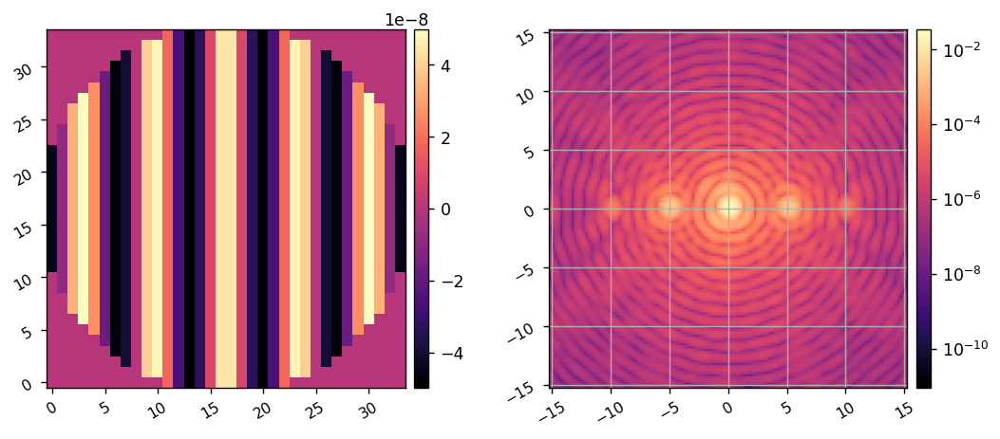

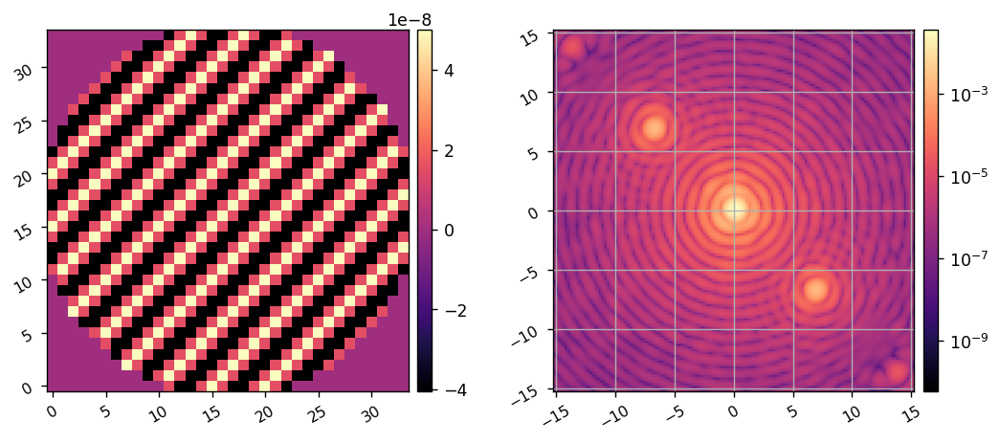

In [5]:
poppy_log.disabled = True

Nact = c.Nact
xpp = np.linspace(-c.Nact/2, c.Nact/2-1, c.Nact) + 1/2
ppx, ppy = np.meshgrid(xpp,xpp)

separation = 5

amp = 5e-8
com_1 = amp*np.cos(2*np.pi*ppx*separation/Nact)*c.dm_mask
com_2 = amp*np.cos(2*np.pi*(ppx - ppy)/separation)*c.dm_mask

c.set_dm(com_1)
im1 = c.snap()
imshow2(c.get_dm(), im1, pxscl2=c.psf_pixelscale_lamD, lognorm2=True, grid2=True)

c.set_dm(com_2)
im2 = c.snap()
imshow2(c.get_dm(), im2, pxscl2=c.psf_pixelscale_lamD, lognorm2=True, grid2=True)

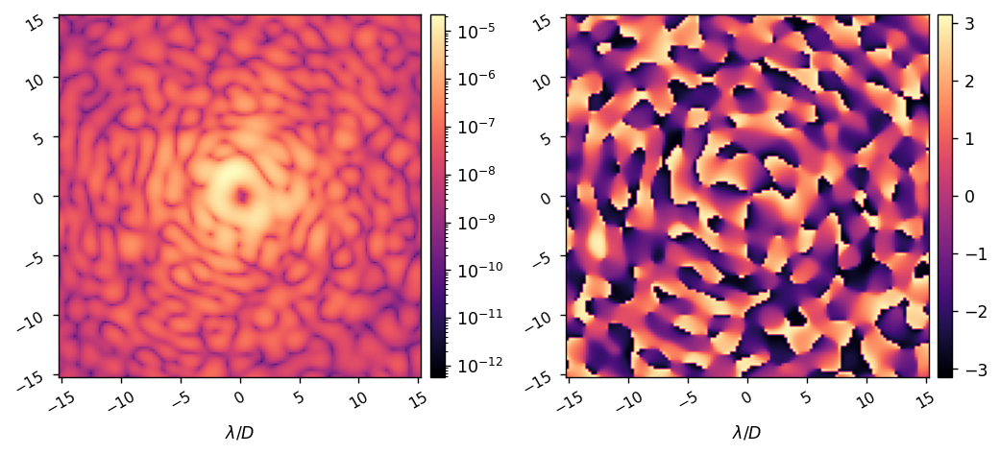

In [6]:
poppy_log.disabled = True

c.reset_dm()

c.FPM = vortex
c.LYOT = lyot_stop
occ_psf = c.calc_psf()

imshow2(np.abs(occ_psf)**2, np.angle(occ_psf),
             pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$',
             lognorm1=True)



# Check difference in speckle field with two different WFE datasets from the telescope optics

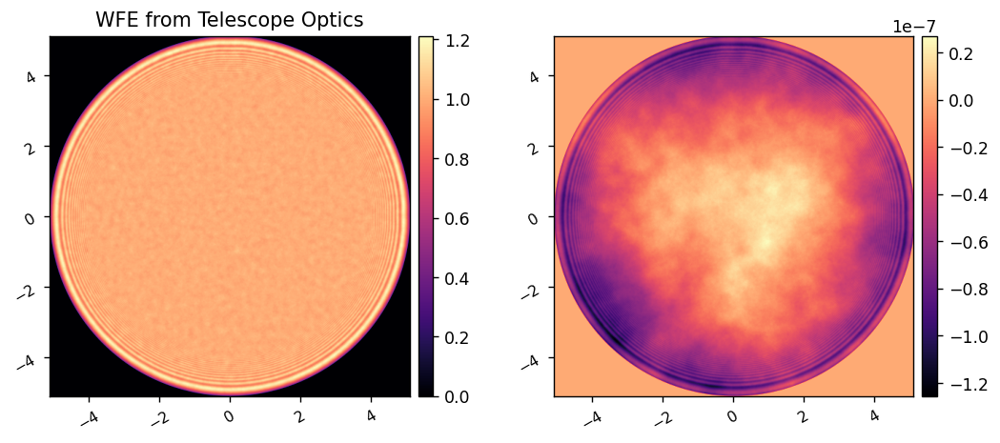

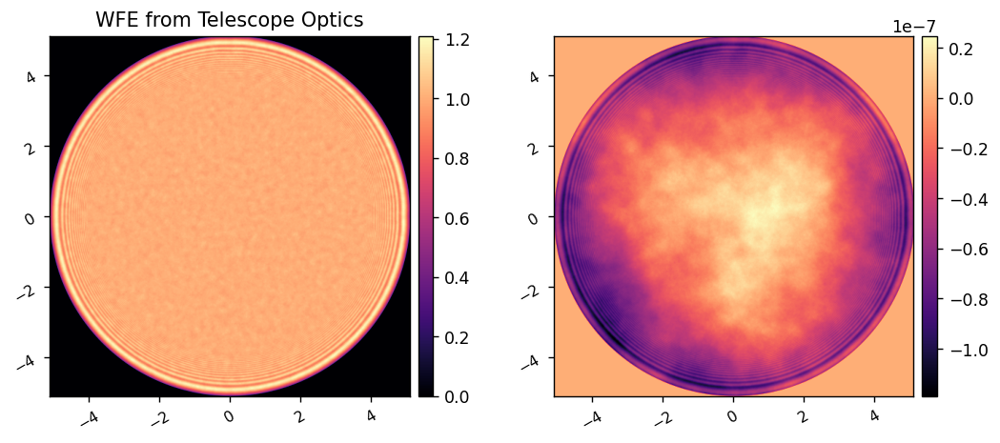

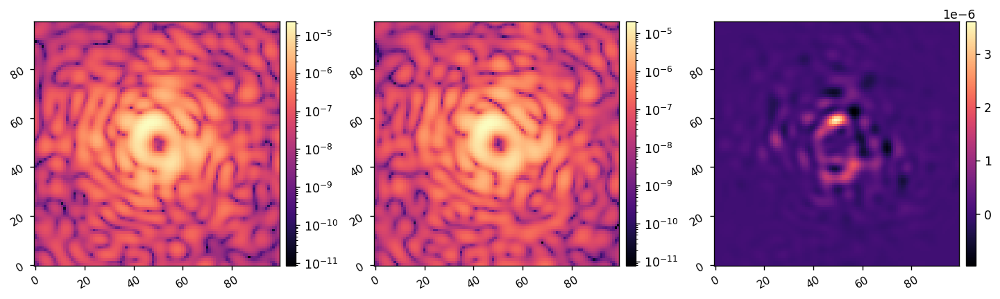

In [7]:
ote_wfe_fname = 'ote-wfe-data/telescope_wfe_1.fits'
wfe_hdu = fits.open(ote_wfe_fname)
wfe = xp.array(wfe_hdu[0].data)
wfe_pxscl = wfe_hdu[0].header['PIXELSCL'] * u.m/u.pix
wfe_hdu.close()
OTE_WFE_1 = poppy.ArrayOpticalElement(transmission=wfe[0], opd=wfe[1], pixelscale=wfe_pxscl,)
imshow2(OTE_WFE_1.amplitude,OTE_WFE_1.opd, 'WFE from Telescope Optics', pxscl=OTE_WFE_1.pixelscale.to(u.mm/u.pix))

ote_wfe_fname = 'ote-wfe-data/telescope_wfe_2.fits'
wfe_hdu = fits.open(ote_wfe_fname)
wfe = xp.array(wfe_hdu[0].data)
wfe_pxscl = wfe_hdu[0].header['PIXELSCL'] * u.m/u.pix
wfe_hdu.close()
OTE_WFE_2 = poppy.ArrayOpticalElement(transmission=wfe[0], opd=wfe[1], pixelscale=wfe_pxscl,)
imshow2(OTE_WFE_2.amplitude, OTE_WFE_2.opd, 'WFE from Telescope Optics', pxscl=OTE_WFE_2.pixelscale.to(u.mm/u.pix))

reload(full)
c = full.CORO()

c.npix = 256
c.oversample = 16
c.use_opds = True

c.APODIZER = None
c.FPM = vortex
c.LYOT = lyot_stop

c.OTEWFE = OTE_WFE_1
im1=c.snap()

c.OTEWFE = OTE_WFE_2
im2=c.snap()


imshow3(im1, im2, im1-im2, lognorm1=True, lognorm2=True)

# Calculate all wavefront data and select the pupil planes for furture use in the compact model of the coronagraph

Propagating wavelength 750.000 nm.
PSF calculated in 0.688s


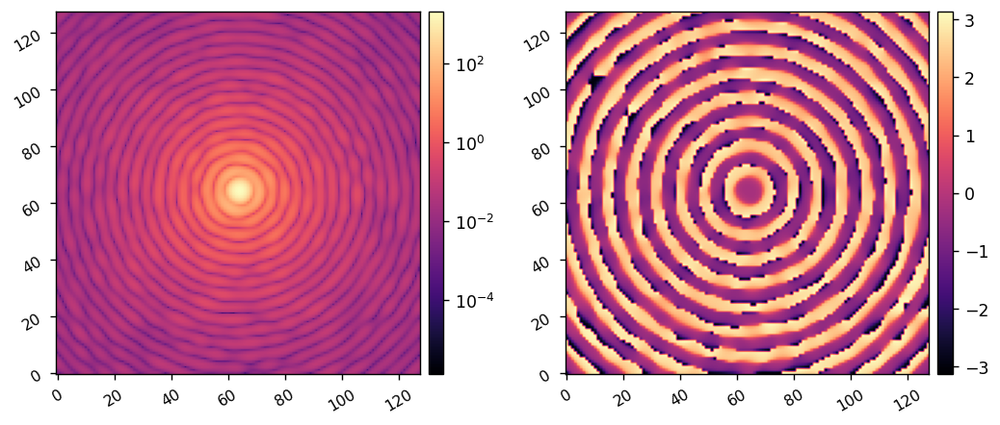

In [8]:
poppy_log.disabled = True

reload(full)
c = full.CORO()

c.norm = 'none'

c.npix = 256
c.oversample = 8
c.npsf = 128

c.use_opds = True
c.OTEWFE = OTE_WFE

c.APODIZER = None

c.FPM = None
c.LYOT = None

wfs = c.calc_wfs()

imshow2(wfs[-1].intensity, wfs[-1].phase, lognorm1=True)

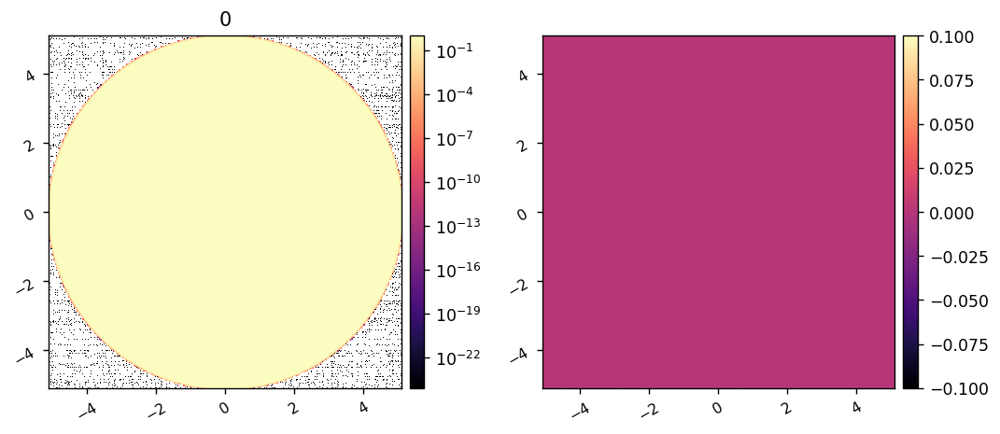

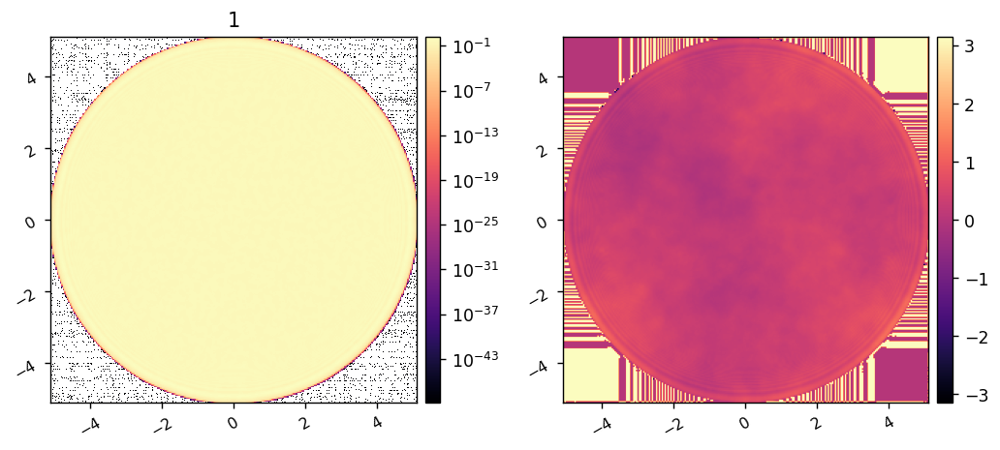

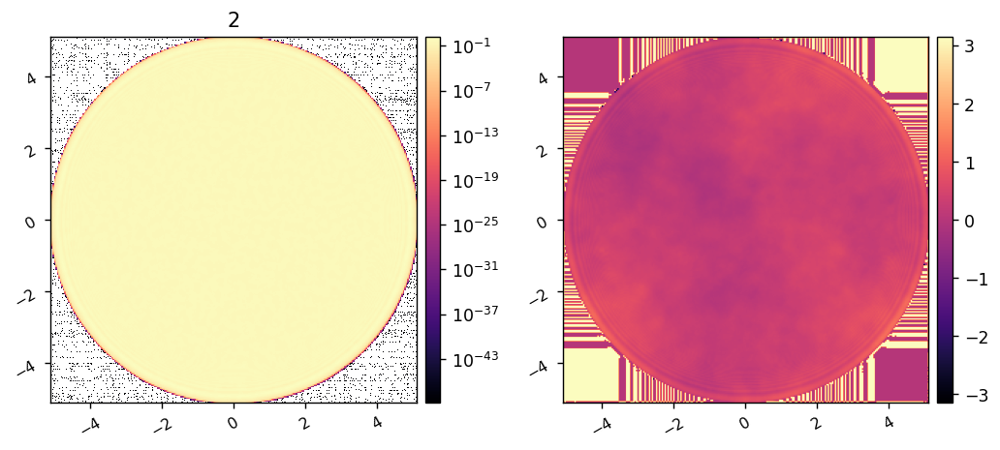

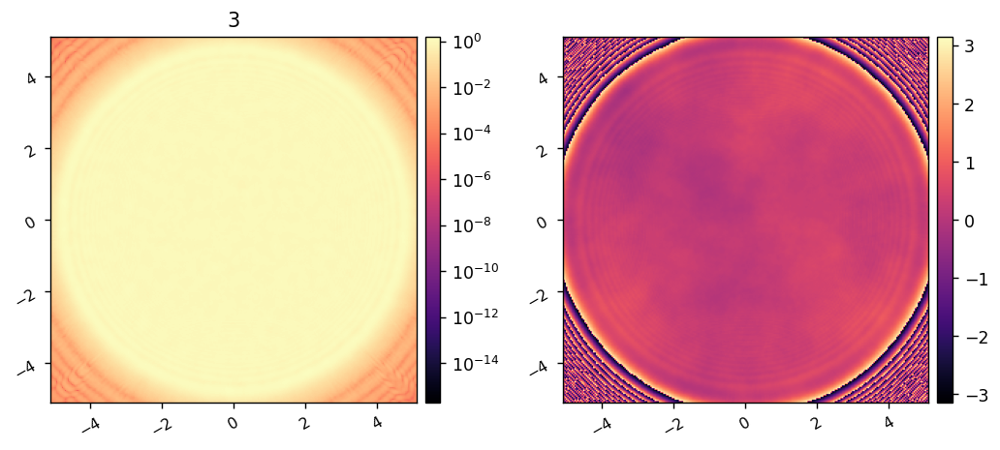

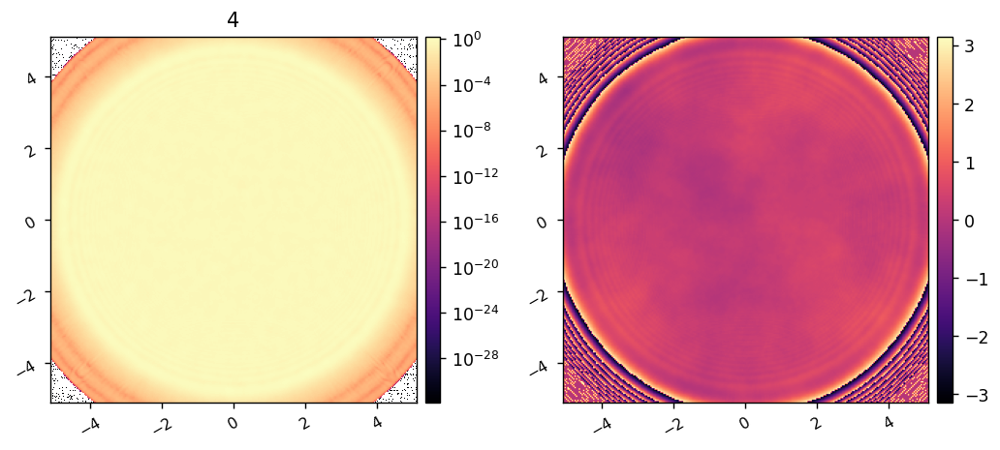

...

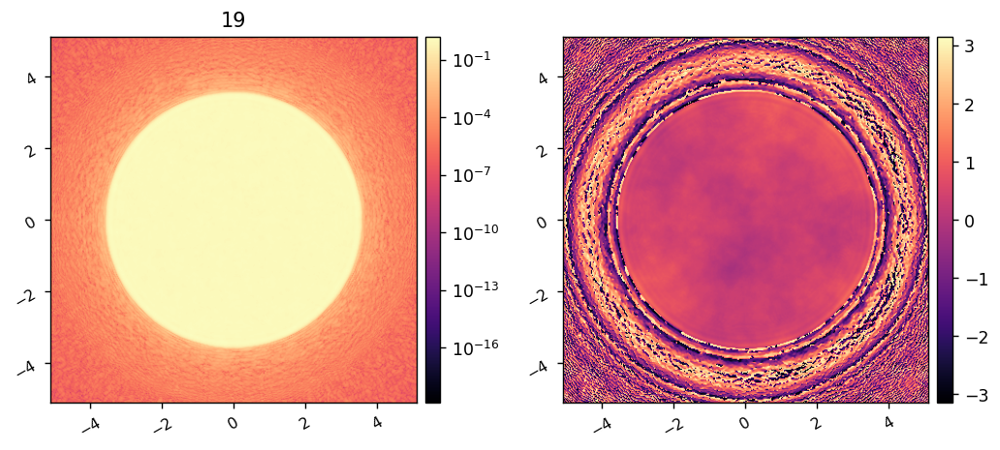

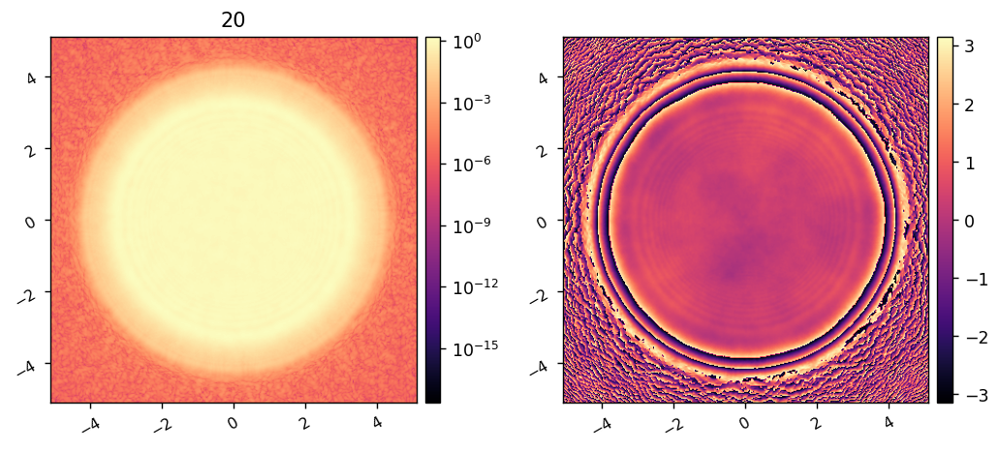

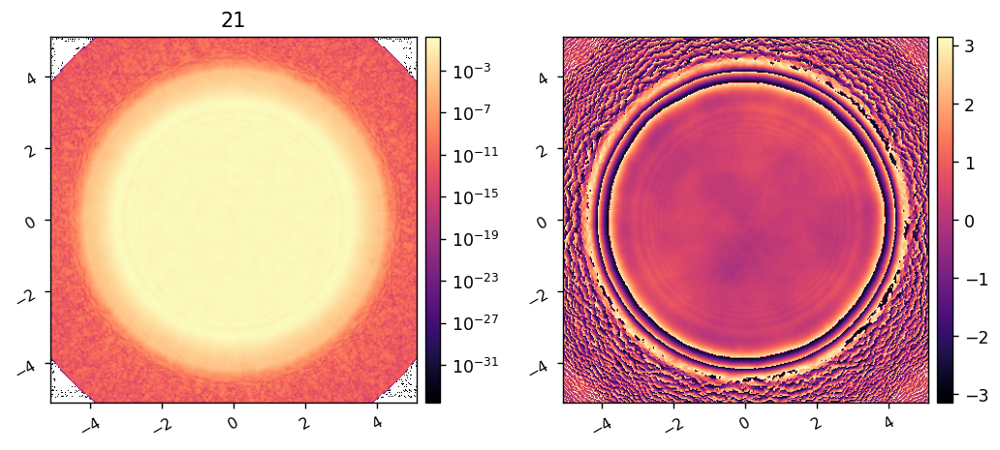

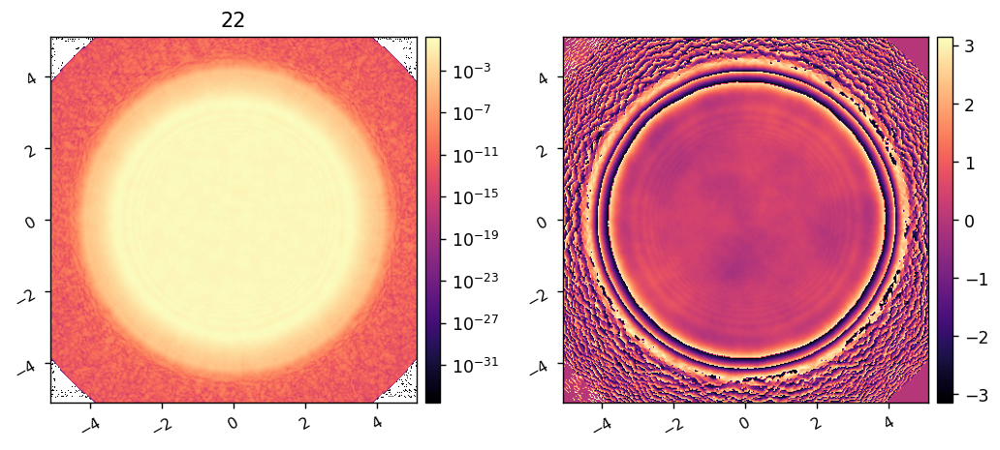

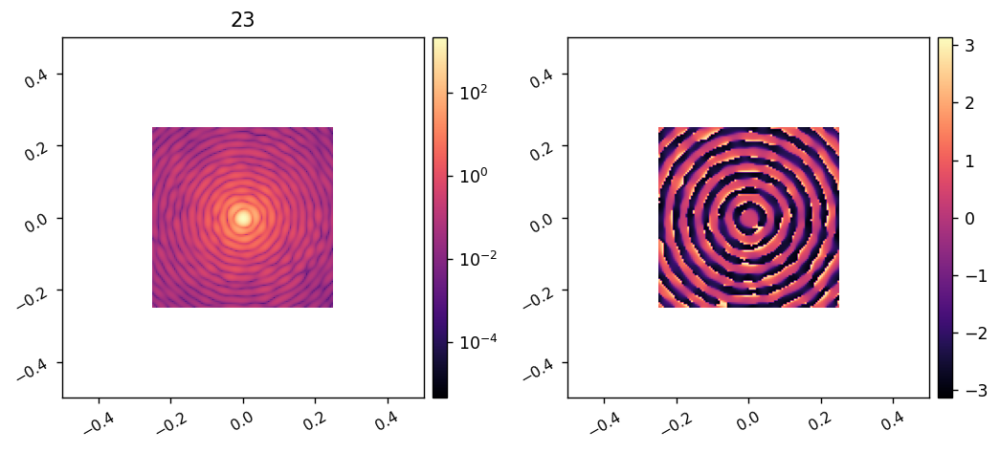

In [7]:
from IPython.display import display

pupil_lim = c.pupil_diam.value/2
fp_lim = 1/2

for i,wf in enumerate(wfs):
    if i-1 in [c.inter_fp_index, c.fpm_index, c.image_index]:
        axlims= [-fp_lim, fp_lim, -fp_lim, fp_lim]
    else:
        axlims= [-pupil_lim, pupil_lim, -pupil_lim, pupil_lim]
    imshow2(wf.intensity, wf.phase, '{:d}'.format(i), 
                 pxscl1=wf.pixelscale.to(u.mm/u.pix), pxscl2=wf.pixelscale.to(u.mm/u.pix),
                 axlims=axlims,
                 lognorm1=True,)

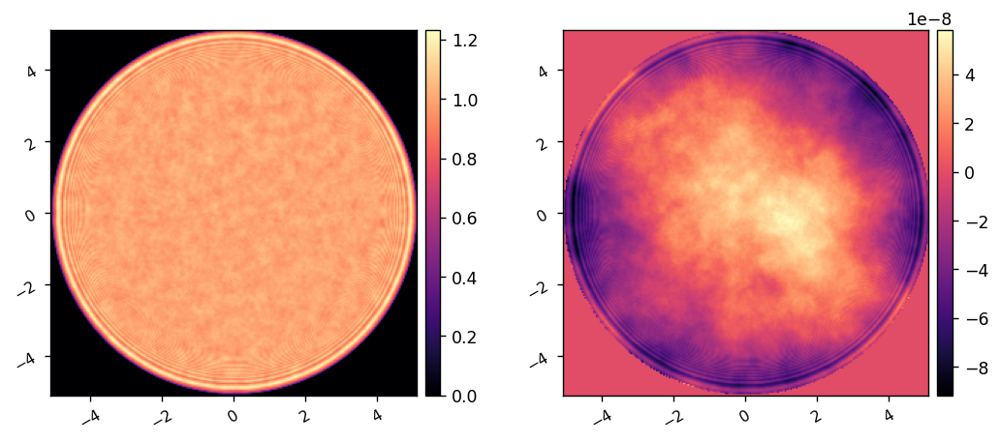

Saved data to:  phase-retrieval-data/pre_fpm_pupil_wfe.fits


In [17]:
import misc_funs as misc
pre_fpm_pupil = wfs[10]

x,y = pre_fpm_pupil.coordinates()
r = np.sqrt(x**2 + y**2)
pre_fpm_mask = r<0.0051

amp = poppy.utils.pad_or_crop_to_shape(pre_fpm_pupil.amplitude*pre_fpm_mask, (c.npix,c.npix))
opd = poppy.utils.pad_or_crop_to_shape(pre_fpm_pupil.phase*pre_fpm_mask, (c.npix,c.npix)) * wavelength_c.to_value(u.m)/(2*np.pi)

imshow2(amp, opd,
#              axlims=[-5.1, 5.1, -5.1, 5.1], 
#              npix=c.npix,
             pxscl=pre_fpm_pupil.pixelscale.to(u.mm/u.pix))

data = xp.array([amp,opd])
misc.save_fits('phase-retrieval-data/pre_fpm_pupil_wfe.fits', data=data, 
               header={'PIXELSCL':pre_fpm_pupil.pixelscale.value})

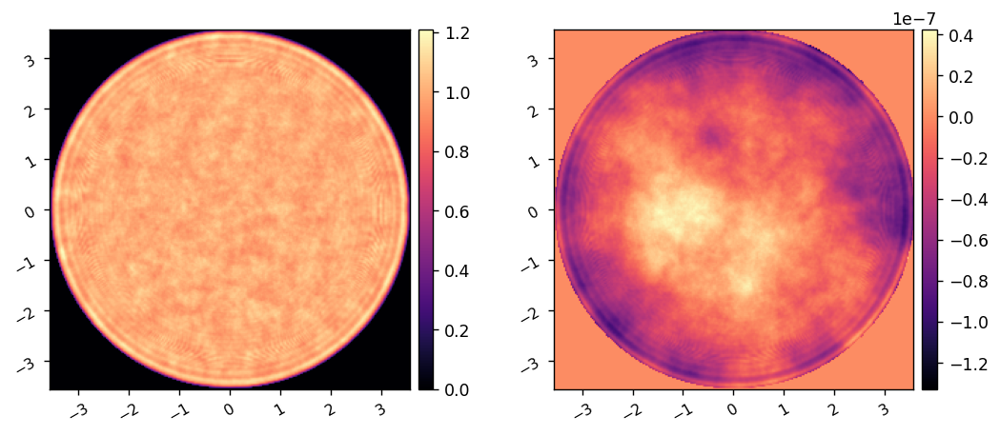

Saved data to:  phase-retrieval-data/post_fpm_pupil_wfe.fits


In [15]:
post_fpm_pupil = wfs[18]
x,y = post_fpm_pupil.coordinates()
r = np.sqrt(x**2 + y**2)
post_fpm_mask = r<(0.0051*350/500)

amp = poppy.utils.pad_or_crop_to_shape(post_fpm_pupil.amplitude*post_fpm_mask, (c.npix,c.npix))
opd = poppy.utils.pad_or_crop_to_shape(post_fpm_pupil.phase*post_fpm_mask, (c.npix,c.npix)) * wavelength_c.to_value(u.m)/(2*np.pi)

imshow2(amp, opd,
#              axlims=[-5.1, 5.1, -5.1, 5.1], 
#              npix=c.npix,
             pxscl=post_fpm_pupil.pixelscale.to(u.mm/u.pix))

data = xp.array([amp,opd])
misc.save_fits('phase-retrieval-data/post_fpm_pupil_wfe.fits', data=data, 
               header={'PIXELSCL':post_fpm_pupil.pixelscale.value*500/350})